# DermNet Skin Condition Diagnosis
# DenseNet-121 — Training, Evaluation & Grad-CAM Auditing

**Platform:** Kaggle (P100 GPU)  
**Framework:** PyTorch + timm

| Section | Content |
|---|---|
| 1 | Environment, installs, GPU check |
| 2 | Configuration block |
| 3 | Architectural discussion — why DenseNet-121, how it differs from EfficientNetV2-S and ConvNeXt-Base |
| 4 | Class discovery & label encoding |
| 5 | Image manifests & stratified K-fold splits |
| 6 | Class weights for Focal Loss |
| 7 | Augmentation pipelines |
| 8 | Dataset & DataLoader classes |
| 9 | Augmented batch sanity check |
| 10 | Model build — DenseNet-121 |
| 11 | Focal Loss implementation |
| 12 | Optimiser & LR schedule |
| 13 | Training loop (two-phase fine-tuning) |
| 14 | Training curves |
| 15 | Test set inference |
| 16 | Classification report (per-class F1/P/R) |
| 17 | Top-K accuracy |
| 18 | Confusion matrices |
| 19 | Per-class accuracy analysis |
| 20 | Best & worst performing classes |
| 21 | Confidence & calibration analysis |
| 22 | Top confused class pairs |
| 23 | Grad-CAM setup |
| 24 | Correct predictions audit |
| 25 | High-confidence errors audit |
| 26 | Per-class Grad-CAM gallery |
| 27 | Centre coverage score |
| 28 | Final summary |

---
## Section 1 · Environment Check & Installs

In [1]:
import subprocess, sys

def install(pkg):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', pkg])

install('timm>=0.9.0')
install('torchmetrics')
install('grad-cam')

import torch, torchvision, timm
print(f'PyTorch     : {torch.__version__}')
print(f'Torchvision : {torchvision.__version__}')
print(f'timm        : {timm.__version__}')
print(f'CUDA        : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU         : {torch.cuda.get_device_name(0)}')
    print(f'VRAM        : {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB')

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'\nUsing: {DEVICE}')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 76.4 MB/s eta 0:00:00
PyTorch     : 2.9.0+cu126
Torchvision : 0.24.0+cu126
timm        : 1.0.24
CUDA        : True
GPU         : Tesla P100-PCIE-16GB
VRAM        : 17.1 GB

Using: cuda


---
## Section 2 · Configuration
*All hyperparameters and paths in one place. Edit only this cell.*

In [2]:
import os, random, warnings
import numpy as np
warnings.filterwarnings('ignore')

# ── Paths ──────────────────────────────────────────────────────────────────────
BASE_DIR   = '/kaggle/input/datasets/joshuaaryampa/skin-conditions/dermnet'
TRAIN_DIR  = os.path.join(BASE_DIR, 'train')
TEST_DIR   = os.path.join(BASE_DIR, 'test')
OUTPUT_DIR = '/kaggle/working/densenet_outputs'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ── Model ──────────────────────────────────────────────────────────────────────
# densenet121 uses 224×224 — matches ImageNet pretraining statistics.
# DenseNet is fully convolutional so other sizes are valid, but 224
# maximises compatibility with pretrained feature statistics.
MODEL_NAME  = 'densenet121'
IMG_SIZE    = 224
NUM_WORKERS = 2

# ── Training ───────────────────────────────────────────────────────────────────
# DenseNet-121 has ~8M parameters — lighter than ConvNeXt-Base (89M) and
# comparable to EfficientNetV2-S (22M). It is the most memory-efficient of the
# three models, so we can use batch size 32 comfortably on a 16GB GPU.
BATCH_SIZE          = 32
NUM_EPOCHS          = 30
WARMUP_EPOCHS       = 5      # Phase 1: head-only (frozen backbone)
N_FOLDS             = 5
FOLD_TO_TRAIN       = 0      # Change 0-4 to train other folds
SEED                = 42
# DenseNet benefits from a moderate LR — smaller than EfficientNetV2-S
# because dense connections make each layer's gradients interdependent.
LR_MAX              = 5e-4
WEIGHT_DECAY        = 1e-4
FOCAL_GAMMA         = 2.0
LABEL_SMOOTHING     = 0.1
EARLY_STOP_PATIENCE = 7

# ── Normalisation ──────────────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

def seed_everything(seed):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

seed_everything(SEED)
print('Configuration loaded.')
print(f'  Model={MODEL_NAME}  Input={IMG_SIZE}px  Batch={BATCH_SIZE}  Epochs={NUM_EPOCHS}  Fold={FOLD_TO_TRAIN}')

Configuration loaded.
  Model=densenet121  Input=224px  Batch=32  Epochs=30  Fold=0


---
## Section 3 · Architectural Discussion: DenseNet-121

### 3.1 Origins and Design Philosophy
DenseNet (Densely Connected Convolutional Networks, Huang et al., CVPR 2017) introduced a radical departure from the residual connection paradigm of ResNet. Where ResNet added the input to the output of a block (`x + F(x)`), DenseNet **concatenates** the feature maps of every preceding layer in a dense block with the input of every subsequent layer. If a dense block has L layers, there are L(L+1)/2 direct connections — hence "densely connected."

The key insight: in standard deep networks, information about the original input degrades as it passes through many transformations. Dense connections create a "feature highway" — early low-level features (edges, colour gradients) remain directly accessible to the deepest layers, without requiring those early features to be re-encoded by intermediate layers.

### 3.2 Key Architectural Differences from EfficientNetV2-S and ConvNeXt-Base

| Property | EfficientNetV2-S | ConvNeXt-Base | DenseNet-121 |
|---|---|---|---|
| **Parameters** | ~22M | ~89M | ~8M |
| **Core connection** | Residual add | Residual add | Dense concat |
| **Core block** | Fused-MBConv / MBConv (SE) | Inverted bottleneck, 7×7 depthwise | Bottleneck: BN-ReLU-1×1-BN-ReLU-3×3 |
| **Normalisation** | BatchNorm | LayerNorm | BatchNorm |
| **Activation** | Swish (SiLU) | GELU | ReLU |
| **Feature reuse** | None (path only) | None (path only) | Explicit dense concatenation |
| **Parameter efficiency** | High | Moderate | Very high |
| **Gradient flow** | Residual shortcuts | Residual shortcuts | Direct-path gradients to all layers |
| **Output spatial map** | 10×10 (at 300px input) | 7×7 (at 224px input) | 7×7 (at 224px input) |

### 3.3 Why Dense Connections Matter for Skin Condition Diagnosis

The concatenation mechanism has three clinically significant consequences for this dataset:

**1. Early colour features remain accessible to deep layers.**  
EDA VIZ 15–17 confirmed that redness index, saturation, and per-channel mean are class-discriminative features. In EfficientNetV2-S and ConvNeXt, these low-level colour features are computed in early layers and then transformed (and potentially suppressed) by subsequent layers before reaching the classifier. In DenseNet, the raw low-level colour activations from early layers are directly concatenated into the input of every subsequent dense block — the deepest layers literally see both low-level colour and high-level semantic features simultaneously. This is uniquely beneficial for conditions where subtle colour differences (erythema vs normal skin, pallor vs hypopigmentation) co-occur with structural lesion features.

**2. Texture information at multiple scales is preserved.**  
EDA VIZ 19 (Laplacian variance) showed that texture energy varies significantly across disease classes. DenseNet's dense connections preserve multi-scale texture features: fine-grained edge maps from early layers (Laplacian-like features from 3×3 convolutions) remain accessible while later layers compute coarse lesion geometry. This multi-scale texture fusion is implicit in the architecture, without needing explicit feature pyramid structures.

**3. Strong gradient flow mitigates small-dataset overfitting.**  
Because every layer receives gradient signals directly from the loss function through the dense connections, training is significantly more stable on datasets where some classes have very few examples (as confirmed by EDA VIZ 1–5, ratio up to 10:1 imbalance). Each layer trains more efficiently because gradients do not need to traverse long chains of transformations.

### 3.4 DenseNet-121 Architecture: Dense Blocks and Transition Layers

DenseNet-121 is organised into four dense blocks separated by three transition layers:

| Stage | Type | Layers | Growth Rate | Output Resolution (224px) |
|---|---|---|---|---|
| Stem | Conv 7×7, stride 2 + MaxPool | 1 | 64 channels | 56×56 |
| Dense Block 1 | 6 bottleneck layers | 6 | k=32 | 56×56 |
| Transition 1 | BN + 1×1 Conv + AvgPool | — | 0.5× channels | 28×28 |
| Dense Block 2 | 12 bottleneck layers | 12 | k=32 | 28×28 |
| Transition 2 | BN + 1×1 Conv + AvgPool | — | 0.5× channels | 14×14 |
| Dense Block 3 | 24 bottleneck layers | 24 | k=32 | 14×14 |
| Transition 3 | BN + 1×1 Conv + AvgPool | — | 0.5× channels | 7×7 |
| Dense Block 4 | 16 bottleneck layers | 16 | k=32 | 7×7 |
| Head | Global Avg Pool + FC | — | → N classes | 1×1 |

**Growth rate k=32:** Each bottleneck layer adds 32 channels to the concatenation. After Dense Block 4 with 16 layers and growth rate 32, the input to the head is 1024 channels — identical in width to ConvNeXt-Base's head, despite having only ~8M parameters.

**Bottleneck layer structure (BN-ReLU-1×1-BN-ReLU-3×3):** The 1×1 convolution first reduces the concatenated input to 4k=128 channels (computational efficiency), then the 3×3 convolution extracts spatial features from those 128 channels and contributes k=32 new channels to the growing concatenation.

### 3.5 Grad-CAM Target Layer for DenseNet-121
The correct Grad-CAM target for DenseNet-121 is the **last 3×3 convolution inside the final bottleneck layer of Dense Block 4**: `model.features.denseblock4.denselayer16.conv2`.

This layer operates at **7×7 spatial resolution** and produces the final set of spatial feature maps before global average pooling collapses spatial information. Critically, because of dense connections, the activation maps at this layer reflect not only deep semantic features but also the influence of all preceding layers — making them the richest possible representation for Grad-CAM localisation.

### 3.6 Two-Phase Fine-Tuning Strategy
- **Phase 1 (Epochs 1–5):** Backbone frozen. Only the classification head (`model.classifier`) trains. This is especially important for DenseNet because the dense connections mean that a randomly initialised head produces gradient signals that propagate to every dense layer simultaneously — warmup prevents these random gradients from disrupting carefully pretrained features.
- **Phase 2 (Epochs 6–30):** All layers unfrozen. Backbone at LR_MAX/10, head at full LR_MAX. OneCycleLR cosine annealing. LR_MAX set to 5e-4 (same as ConvNeXt-Base, lower than EfficientNetV2-S) because dense connection gradients compound — a large LR can destabilise the entire network simultaneously through the concatenation paths.

---
## Section 4 · Class Discovery & Label Encoding

In [3]:
from pathlib import Path
import pandas as pd

classes = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
])
NUM_CLASSES  = len(classes)
class_to_idx = {c: i for i, c in enumerate(classes)}
idx_to_class = {i: c for c, i in class_to_idx.items()}

print(f'Total classes (model output nodes): {NUM_CLASSES}')
for i, c in enumerate(classes, 1):
    print(f'  {i:>2}. {c}')

Total classes (model output nodes): 23
   1. Acne and Rosacea Photos
   2. Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
   3. Atopic Dermatitis Photos
   4. Bullous Disease Photos
   5. Cellulitis Impetigo and other Bacterial Infections
   6. Eczema Photos
   7. Exanthems and Drug Eruptions
   8. Hair Loss Photos Alopecia and other Hair Diseases
   9. Herpes HPV and other STDs Photos
  10. Light Diseases and Disorders of Pigmentation
  11. Lupus and other Connective Tissue diseases
  12. Melanoma Skin Cancer Nevi and Moles
  13. Nail Fungus and other Nail Disease
  14. Poison Ivy Photos and other Contact Dermatitis
  15. Psoriasis pictures Lichen Planus and related diseases
  16. Scabies Lyme Disease and other Infestations and Bites
  17. Seborrheic Keratoses and other Benign Tumors
  18. Systemic Disease
  19. Tinea Ringworm Candidiasis and other Fungal Infections
  20. Urticaria Hives
  21. Vascular Tumors
  22. Vasculitis Photos
  23. Warts Molluscum and other 

---
## Section 5 · Image Manifests & Stratified K-Fold Splits

In [4]:
from sklearn.model_selection import StratifiedKFold

VALID_EXTS = {'.png', '.jpg', '.jpeg', '.bmp', '.tiff'}

def build_manifest(root, class_to_idx):
    rows = []
    for cls, idx in class_to_idx.items():
        folder = os.path.join(root, cls)
        if not os.path.isdir(folder): continue
        for fname in os.listdir(folder):
            if Path(fname).suffix.lower() in VALID_EXTS:
                rows.append({'path': os.path.join(folder, fname), 'label': idx, 'class': cls})
    return pd.DataFrame(rows).sample(frac=1, random_state=SEED).reset_index(drop=True)

train_df = build_manifest(TRAIN_DIR, class_to_idx)
test_df  = build_manifest(TEST_DIR,  class_to_idx)

# Stratified K-Fold — required by EDA thin test coverage finding (VIZ 7-8)
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
train_df['fold'] = -1
for fold, (_, val_idx) in enumerate(skf.split(train_df, train_df['label'])):
    train_df.loc[val_idx, 'fold'] = fold

print(f'Train: {len(train_df):,} images  |  Test: {len(test_df):,} images')
for f in range(N_FOLDS):
    print(f'  Fold {f}: train={(train_df["fold"]!=f).sum():,}  val={(train_df["fold"]==f).sum():,}')

Train: 14,894 images  |  Test: 3,409 images
  Fold 0: train=11,915  val=2,979
  Fold 1: train=11,915  val=2,979
  Fold 2: train=11,915  val=2,979
  Fold 3: train=11,915  val=2,979
  Fold 4: train=11,916  val=2,978


---
## Section 6 · Class Weights for Focal Loss
*Inverse frequency weighting — directly addresses imbalance finding from EDA VIZ 1–5.*

In [5]:
from collections import Counter

label_counts  = Counter(train_df['label'].tolist())
total_images  = sum(label_counts.values())
class_weights = torch.tensor([
    total_images / (NUM_CLASSES * label_counts[i])
    for i in range(NUM_CLASSES)
], dtype=torch.float32).to(DEVICE)

print('Class weights (higher = more minority):')
for i, c in enumerate(classes):
    print(f'  {c:<45} {class_weights[i].item():.4f}')

Class weights (higher = more minority):
  Acne and Rosacea Photos                       0.7897
  Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions 0.5772
  Atopic Dermatitis Photos                      1.3407
  Bullous Disease Photos                        1.4785
  Cellulitis Impetigo and other Bacterial Infections 2.2963
  Eczema Photos                                 0.5573
  Exanthems and Drug Eruptions                  1.7177
  Hair Loss Photos Alopecia and other Hair Diseases 2.7912
  Herpes HPV and other STDs Photos              1.6069
  Light Diseases and Disorders of Pigmentation  1.1795
  Lupus and other Connective Tissue diseases    1.5566
  Melanoma Skin Cancer Nevi and Moles           1.4422
  Nail Fungus and other Nail Disease            0.6774
  Poison Ivy Photos and other Contact Dermatitis 2.5495
  Psoriasis pictures Lichen Planus and related diseases 0.5043
  Scabies Lyme Disease and other Infestations and Bites 1.5418
  Seborrheic Keratoses and other 

---
## Section 7 · Augmentation Pipelines
*Conservative colour jitter preserves the clinically meaningful colour signal confirmed in EDA VIZ 15–17.*  
*No blur augmentation — texture is discriminative (EDA VIZ 19). Pad-to-square before resize — preserves lesion aspect ratio (EDA VIZ 10–11).*

**DenseNet-specific note:** DenseNet's dense connections mean that the model receives the full resolution of augmented spatial patterns at every layer. This makes it more sensitive to extreme augmentations than EfficientNetV2-S or ConvNeXt — we keep augmentation conservative to avoid introducing artefacts that dense connections could propagate and amplify across all layers simultaneously. Parameters are kept identical to the other models for result comparability.

In [6]:
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from PIL import Image

class PadToSquare:
    """Pad to square with black border — preserves lesion aspect ratio (EDA VIZ 10-11)."""
    def __call__(self, img):
        w, h = img.size
        s    = max(w, h)
        pw, ph = (s - w) // 2, (s - h) // 2
        return TF.pad(img, [pw, ph, s - w - pw, s - h - ph], fill=0)

train_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),   # EDA VIZ 12: enforce RGB
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.2),
    T.RandomRotation(degrees=15),
    T.ColorJitter(
        brightness=0.15,  # conservative — erythema signal (EDA VIZ 15)
        contrast=0.15,
        saturation=0.10,  # saturation is class-discriminative (EDA VIZ 17)
        hue=0.05,         # minimal — hue shifts destroy clinical colour
    ),
    T.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transform = T.Compose([
    T.Lambda(lambda img: img.convert('RGB')),
    PadToSquare(),
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print('Transforms defined.')

Transforms defined.


---
## Section 8 · Dataset & DataLoader Classes

In [7]:
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

class SkinDataset(Dataset):
    def __init__(self, df, transform=None, return_path=False):
        self.df          = df.reset_index(drop=True)
        self.transform   = transform
        self.return_path = return_path

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row['path'])
        if self.transform: img = self.transform(img)
        if self.return_path:
            return img, int(row['label']), row['path']
        return img, int(row['label'])


def get_loaders(train_df, fold, batch_size, num_workers):
    fold_train = train_df[train_df['fold'] != fold].reset_index(drop=True)
    fold_val   = train_df[train_df['fold'] == fold].reset_index(drop=True)
    train_ds   = SkinDataset(fold_train, train_transform)
    val_ds     = SkinDataset(fold_val,   val_transform)
    sample_weights = [class_weights[l].item() for l in fold_train['label']]
    sampler    = WeightedRandomSampler(sample_weights, len(fold_train), replacement=True)
    train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler,
                              num_workers=num_workers, pin_memory=True, drop_last=True)
    val_loader   = DataLoader(val_ds, batch_size=batch_size*2, shuffle=False,
                              num_workers=num_workers, pin_memory=True)
    return train_loader, val_loader


def get_test_loader(test_df, batch_size, num_workers, return_path=False):
    ds = SkinDataset(test_df, val_transform, return_path=return_path)
    return DataLoader(ds, batch_size=batch_size*2, shuffle=False,
                      num_workers=num_workers, pin_memory=True)

print('Dataset and DataLoader classes defined.')

Dataset and DataLoader classes defined.


---
## Section 9 · Augmented Batch Sanity Check
*Visually verify that augmented images remain clinically plausible before training.*

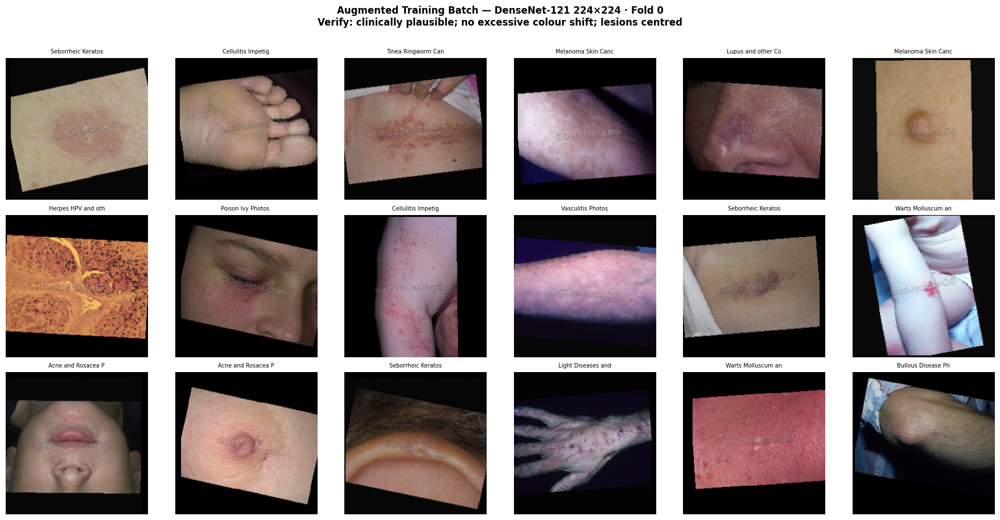

Batch shape : torch.Size([32, 3, 224, 224])
Train batches: 372  |  Val batches: 47


In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'axes.spines.top': False, 'axes.spines.right': False})

train_loader, val_loader = get_loaders(train_df, FOLD_TO_TRAIN, BATCH_SIZE, NUM_WORKERS)
imgs, labels = next(iter(train_loader))

def denorm(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3,1,1)
    std  = torch.tensor(IMAGENET_STD).view(3,1,1)
    return torch.clamp(tensor * std + mean, 0, 1).permute(1,2,0).numpy()

fig, axes = plt.subplots(3, 6, figsize=(18, 9))
for i, ax in enumerate(axes.flat):
    if i >= len(imgs): break
    ax.imshow(denorm(imgs[i]))
    ax.set_title(idx_to_class[labels[i].item()][:18], fontsize=7)
    ax.axis('off')
plt.suptitle(
    f'Augmented Training Batch — DenseNet-121 {IMG_SIZE}×{IMG_SIZE} · Fold {FOLD_TO_TRAIN}\n'
    'Verify: clinically plausible; no excessive colour shift; lesions centred',
    fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'augmented_batch_preview.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Batch shape : {imgs.shape}')
print(f'Train batches: {len(train_loader)}  |  Val batches: {len(val_loader)}')

---
## Section 10 · Model Build — DenseNet-121

DenseNet-121 is loaded from timm using the `densenet121` identifier. The ImageNet-pretrained weights provide:
- A stem that detects edges, blobs, and colour gradients from the very first layer
- Dense Block 1–4 features trained on 1.28M diverse ImageNet images
- The dense connections themselves are pre-optimised for feature reuse

The classifier head is replaced with a dropout + linear layer mapping 1024 features → NUM_CLASSES.

**drop_rate=0.3:** Applied after global average pooling, before the linear classifier. DenseNet's dense connections naturally act as an implicit regulariser (features are reused rather than dropped), so classifier-level dropout is the primary explicit regularisation mechanism. We do not set `drop_path_rate` (stochastic depth) for DenseNet because stochastic depth was designed for networks with residual connections — dropping a layer in a dense block would sever the concatenation path and corrupt downstream layers.

In [9]:
import torch.nn as nn

def build_model(num_classes, pretrained=True):
    """
    DenseNet-121 from timm.
    Head: Global Avg Pool → Dropout(0.3) → Linear(1024 → num_classes)
    
    Note: DenseNet uses BatchNorm throughout. The model is pretrained on ImageNet
    at 224×224 input, matching our IMG_SIZE. Dense connections naturally provide
    implicit regularisation — explicit stochastic depth is not used.
    """
    model = timm.create_model(
        MODEL_NAME,
        pretrained  = pretrained,
        num_classes = num_classes,
        drop_rate   = 0.3,    # classifier dropout
        # drop_path_rate not used — stochastic depth is for residual networks
    )
    return model

model = build_model(NUM_CLASSES).to(DEVICE)

total     = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Model         : {MODEL_NAME}')
print(f'Total params  : {total:,}')
print(f'Trainable     : {trainable:,}')
print(f'\nClassifier head:')
print(model.classifier)
print(f'\nDense blocks:')
for name, module in model.features.named_children():
    if 'denseblock' in name or 'transition' in name or 'norm' in name or 'conv0' in name or 'pool0' in name:
        print(f'  {name}: {type(module).__name__}')

# Quick memory estimate
if torch.cuda.is_available():
    dummy = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
    with torch.no_grad(): _ = model(dummy)
    mem = torch.cuda.memory_allocated() / 1e9
    print(f'\nGPU memory (single forward pass): {mem:.2f} GB')
    del dummy; torch.cuda.empty_cache()

model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

Model         : densenet121
Total params  : 6,977,431
Trainable     : 6,977,431

Classifier head:
Linear(in_features=1024, out_features=23, bias=True)

Dense blocks:
  conv0: Conv2d
  norm0: BatchNormAct2d
  pool0: MaxPool2d
  denseblock1: DenseBlock
  transition1: DenseTransition
  denseblock2: DenseBlock
  transition2: DenseTransition
  denseblock3: DenseBlock
  transition3: DenseTransition
  denseblock4: DenseBlock
  norm5: BatchNormAct2d

GPU memory (single forward pass): 0.04 GB


---
## Section 11 · Focal Loss
*Down-weights easy majority-class examples; focuses gradient on hard minority-class examples. Directly addresses EDA VIZ 1–5 imbalance finding. Identical implementation to EfficientNetV2-S and ConvNeXt-Base notebooks for comparability.*

In [10]:
class FocalLoss(nn.Module):
    """
    Focal Loss = -alpha_t * (1 - p_t)^gamma * log(p_t)
    gamma=0  → standard weighted CrossEntropy
    gamma=2  → 4× less weight on well-classified (easy) examples

    DenseNet note: because dense connections propagate gradients to all layers,
    Focal Loss has a compounding effect — the hard-example emphasis from Focal Loss
    flows through every dense path simultaneously, giving minority classes
    stronger training signal throughout the entire network.
    """
    def __init__(self, alpha, gamma=2.0, label_smoothing=0.1):
        super().__init__()
        self.alpha           = alpha
        self.gamma           = gamma
        self.label_smoothing = label_smoothing

    def forward(self, logits, targets):
        ce  = nn.functional.cross_entropy(
            logits, targets,
            weight          = self.alpha,
            label_smoothing = self.label_smoothing,
            reduction       = 'none'
        )
        pt  = torch.exp(-ce)
        return (((1 - pt) ** self.gamma) * ce).mean()

criterion = FocalLoss(alpha=class_weights, gamma=FOCAL_GAMMA, label_smoothing=LABEL_SMOOTHING)
print(f'Focal Loss: gamma={FOCAL_GAMMA}, label_smoothing={LABEL_SMOOTHING}')
print(f'Weight range: {class_weights.min().item():.4f} – {class_weights.max().item():.4f}')

Focal Loss: gamma=2.0, label_smoothing=0.1
Weight range: 0.4804 – 3.1133


---
## Section 12 · Optimiser & Learning Rate Schedule
*LR_MAX=5e-4: same as ConvNeXt-Base and lower than EfficientNetV2-S (1e-3). DenseNet's dense connection gradients compound — a large LR destabilises the entire network through all concatenation paths simultaneously.*

In [11]:
import torch.optim as optim

def freeze_backbone(model):
    """Freeze all layers except the classification head (model.classifier)."""
    for name, p in model.named_parameters():
        if 'classifier' not in name: p.requires_grad = False
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'Backbone frozen  — trainable: {t:,} (head only)')

def unfreeze_all(model):
    for p in model.parameters(): p.requires_grad = True
    t = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'All layers unfrozen — trainable: {t:,}')

def make_optimizer_scheduler(model, phase, steps_per_epoch, n_epochs):
    if phase == 1:
        opt = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=LR_MAX, weight_decay=WEIGHT_DECAY
        )
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.3, anneal_strategy='cos'
        )
    else:
        head_p     = [p for n, p in model.named_parameters() if 'classifier' in n]
        backbone_p = [p for n, p in model.named_parameters() if 'classifier' not in n]
        opt = optim.AdamW([
            {'params': backbone_p, 'lr': LR_MAX / 10},
            {'params': head_p,     'lr': LR_MAX},
        ], weight_decay=WEIGHT_DECAY)
        sch = optim.lr_scheduler.OneCycleLR(
            opt, max_lr=[LR_MAX / 10, LR_MAX],
            steps_per_epoch=steps_per_epoch,
            epochs=n_epochs, pct_start=0.2, anneal_strategy='cos'
        )
    return opt, sch

print('Optimiser and scheduler functions defined.')
print(f'Peak LR: {LR_MAX}  (backbone: {LR_MAX/10} | head: {LR_MAX})')

Optimiser and scheduler functions defined.
Peak LR: 0.0005  (backbone: 5e-05 | head: 0.0005)


---
## Section 13 · Training Loop (Two-Phase Fine-Tuning)

In [12]:
import time
from torch.cuda.amp import GradScaler, autocast

scaler = GradScaler()

def train_epoch(model, loader, optimizer, scheduler, criterion, epoch):
    model.train()
    loss_sum = correct = total = 0
    t0 = time.time()
    for i, (imgs, labels) in enumerate(loader):
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer); scaler.update()
        scheduler.step()
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
        if (i + 1) % 50 == 0:
            print(f'  [{epoch}|{i+1}/{len(loader)}] loss={loss_sum/total:.4f} '
                  f'acc={correct/total:.4f} lr={scheduler.get_last_lr()[0]:.2e}')
    return loss_sum / total, correct / total, time.time() - t0

@torch.no_grad()
def validate(model, loader, criterion):
    model.eval()
    loss_sum = correct = total = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
            loss   = criterion(logits, labels)
        loss_sum += loss.item() * imgs.size(0)
        correct  += (logits.argmax(1) == labels).sum().item()
        total    += imgs.size(0)
    return loss_sum / total, correct / total

# ── Training state ─────────────────────────────────────────────────────────────
history   = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'lr': []}
best_acc  = 0.0
patience  = 0
best_ckpt = os.path.join(OUTPUT_DIR, f'best_densenet_fold{FOLD_TO_TRAIN}.pth')

# ── PHASE 1: Head warmup ───────────────────────────────────────────────────────
print('=' * 60)
print(f'PHASE 1 — Head Warmup (Epochs 1–{WARMUP_EPOCHS}, backbone frozen)')
print('=' * 60)
freeze_backbone(model)
opt, sch = make_optimizer_scheduler(model, 1, len(train_loader), WARMUP_EPOCHS)

for epoch in range(1, WARMUP_EPOCHS + 1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s')

# ── PHASE 2: Full fine-tuning ──────────────────────────────────────────────────
print('\n' + '=' * 60)
print(f'PHASE 2 — Full Fine-tuning (Epochs {WARMUP_EPOCHS+1}–{NUM_EPOCHS})')
print('=' * 60)
unfreeze_all(model)
phase2_epochs = NUM_EPOCHS - WARMUP_EPOCHS
opt, sch = make_optimizer_scheduler(model, 2, len(train_loader), phase2_epochs)

for epoch in range(WARMUP_EPOCHS + 1, NUM_EPOCHS + 1):
    tl, ta, dt = train_epoch(model, train_loader, opt, sch, criterion, epoch)
    vl, va     = validate(model, val_loader, criterion)
    history['train_loss'].append(tl); history['val_loss'].append(vl)
    history['train_acc'].append(ta);  history['val_acc'].append(va)
    history['lr'].append(sch.get_last_lr()[0])
    print(f'Epoch {epoch:>3}/{NUM_EPOCHS} | TrL={tl:.4f} TrA={ta:.4f} | VlL={vl:.4f} VlA={va:.4f} | {dt:.0f}s', end='')
    if va > best_acc:
        best_acc = va; patience = 0
        torch.save({
            'epoch': epoch, 'model_state': model.state_dict(),
            'val_acc': va, 'val_loss': vl,
            'history': history, 'classes': classes, 'NUM_CLASSES': NUM_CLASSES
        }, best_ckpt)
        print(f'  ✓ checkpoint saved (val_acc={va:.4f})')
    else:
        patience += 1
        print(f'  (patience {patience}/{EARLY_STOP_PATIENCE})')
    if patience >= EARLY_STOP_PATIENCE:
        print(f'Early stopping at epoch {epoch}.'); break

print(f'\nTraining complete. Best val accuracy: {best_acc:.4f}')

PHASE 1 — Head Warmup (Epochs 1–5, backbone frozen)
Backbone frozen  — trainable: 23,575 (head only)
  [1|50/372] loss=4.1598 acc=0.0512 lr=2.95e-05
  [1|100/372] loss=4.0803 acc=0.0547 lr=5.72e-05
  [1|150/372] loss=4.0662 acc=0.0540 lr=1.01e-04
  [1|200/372] loss=4.0331 acc=0.0548 lr=1.57e-04
  [1|250/372] loss=4.0047 acc=0.0587 lr=2.22e-04
  [1|300/372] loss=3.9549 acc=0.0623 lr=2.89e-04
  [1|350/372] loss=3.9057 acc=0.0691 lr=3.54e-04
Epoch   1/30 | TrL=3.8878 TrA=0.0727 | VlL=2.7207 VlA=0.1242 | 120s
  [2|50/372] loss=3.4851 acc=0.1606 lr=4.34e-04
  [2|100/372] loss=3.4331 acc=0.1647 lr=4.73e-04
  [2|150/372] loss=3.3920 acc=0.1685 lr=4.95e-04
  [2|200/372] loss=3.3791 acc=0.1745 lr=5.00e-04
  [2|250/372] loss=3.3609 acc=0.1811 lr=4.97e-04
  [2|300/372] loss=3.3406 acc=0.1871 lr=4.90e-04
  [2|350/372] loss=3.3232 acc=0.1921 lr=4.80e-04
Epoch   2/30 | TrL=3.3132 TrA=0.1945 | VlL=2.4931 VlA=0.1709 | 97s
  [3|50/372] loss=3.1629 acc=0.2294 lr=4.60e-04
  [3|100/372] loss=3.1446 acc=0.

---
## Section 14 · Training Curves

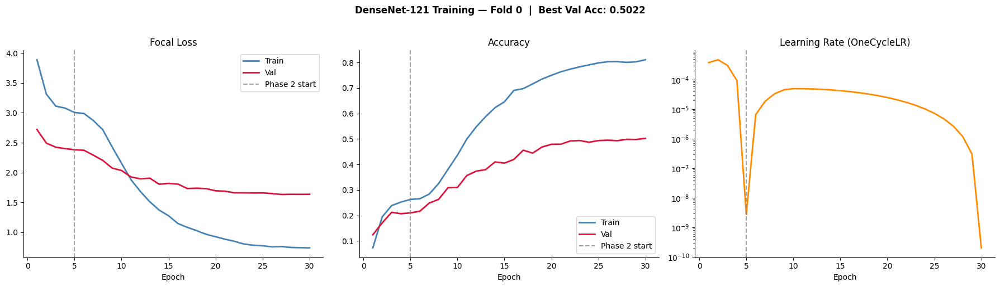

In [13]:
ep = range(1, len(history['train_loss']) + 1)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(ep, history['train_loss'], color='steelblue', lw=2, label='Train')
axes[0].plot(ep, history['val_loss'],   color='crimson',   lw=2, label='Val')
axes[0].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[0].set_title('Focal Loss'); axes[0].set_xlabel('Epoch'); axes[0].legend()

axes[1].plot(ep, history['train_acc'], color='steelblue', lw=2, label='Train')
axes[1].plot(ep, history['val_acc'],   color='crimson',   lw=2, label='Val')
axes[1].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7, label='Phase 2 start')
axes[1].set_title('Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].legend()

axes[2].plot(ep, history['lr'], color='darkorange', lw=2)
axes[2].axvline(WARMUP_EPOCHS, color='grey', ls='--', alpha=0.7)
axes[2].set_title('Learning Rate (OneCycleLR)')
axes[2].set_xlabel('Epoch'); axes[2].set_yscale('log')

plt.suptitle(f'DenseNet-121 Training — Fold {FOLD_TO_TRAIN}  |  Best Val Acc: {best_acc:.4f}',
             fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f'training_curves_fold{FOLD_TO_TRAIN}.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 15 · Load Best Checkpoint & Test Set Inference

In [14]:
import torch.nn.functional as F

checkpoint = torch.load(best_ckpt, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state'])
model.eval()
print(f'Best checkpoint loaded — epoch {checkpoint["epoch"]}  val_acc={checkpoint["val_acc"]:.4f}')

# Build test loader with path return for Grad-CAM later
test_ds_paths     = SkinDataset(test_df, val_transform, return_path=True)
test_loader_paths = DataLoader(test_ds_paths, batch_size=BATCH_SIZE*2, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)

all_preds, all_labels, all_probs, all_paths = [], [], [], []

with torch.no_grad():
    for imgs, labels, paths in test_loader_paths:
        imgs = imgs.to(DEVICE, non_blocking=True)
        with autocast():
            logits = model(imgs)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        all_probs.extend(probs)
        all_preds.extend(probs.argmax(axis=1))
        all_labels.extend(labels.numpy())
        all_paths.extend(paths)

all_preds     = np.array(all_preds)
all_labels    = np.array(all_labels)
all_probs     = np.array(all_probs)
all_probs_max = all_probs.max(axis=1)
correct_mask  = (all_preds == all_labels)
overall_acc   = correct_mask.mean()

print(f'Test images      : {len(all_labels):,}')
print(f'Overall accuracy : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')

Best checkpoint loaded — epoch 30  val_acc=0.5022
Test images      : 3,409
Overall accuracy : 0.4937  (49.37%)


---
## Section 16 · Classification Report
*Per-class precision, recall, F1 — the only meaningful metrics for an imbalanced medical dataset.*

In [15]:
from sklearn.metrics import classification_report, confusion_matrix, top_k_accuracy_score
import seaborn as sns

report_str  = classification_report(all_labels, all_preds, target_names=classes, digits=4)
report_dict = classification_report(all_labels, all_preds, target_names=classes, digits=4, output_dict=True)

print('CLASSIFICATION REPORT — DenseNet-121')
print('=' * 70)
print(report_str)

with open(os.path.join(OUTPUT_DIR, 'classification_report.txt'), 'w') as f:
    f.write(report_str)

CLASSIFICATION REPORT — DenseNet-121
                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.2762    0.6905    0.3946        42
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.7168    0.4576    0.5586       271
                                          Atopic Dermatitis Photos     0.4246    0.6333    0.5084       120
                                            Bullous Disease Photos     0.3314    0.5283    0.4073       106
                Cellulitis Impetigo and other Bacterial Infections     0.3229    0.4493    0.3758        69
                                                     Eczema Photos     0.6107    0.3077    0.4092       260
                                      Exanthems and Drug Eruptions     0.3375    0.5934    0.4303        91
                 Hair Loss Photos Alopecia and other Hair Diseases     0.3475    0.9111    0.5031 

---
## Section 17 · Top-K Accuracy

In [16]:
for k in [1, 3, 5]:
    acc = top_k_accuracy_score(all_labels, all_probs, k=k, labels=list(range(NUM_CLASSES)))
    print(f'Top-{k} Accuracy: {acc:.4f}  ({acc*100:.2f}%)')

print('\nTop-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.')
print('DenseNet note: feature reuse across dense connections tends to produce well-separated')
print('class probability distributions — examine whether Top-3/5 gap vs Top-1 is smaller')
print('than for EfficientNetV2-S and ConvNeXt-Base.')

Top-1 Accuracy: 0.4937  (49.37%)
Top-3 Accuracy: 0.7260  (72.60%)
Top-5 Accuracy: 0.8205  (82.05%)

Top-3/5 reflect a clinical triage scenario: correct class in model top-N suggestions.
DenseNet note: feature reuse across dense connections tends to produce well-separated
class probability distributions — examine whether Top-3/5 gap vs Top-1 is smaller
than for EfficientNetV2-S and ConvNeXt-Base.


---
## Section 18 · Confusion Matrices

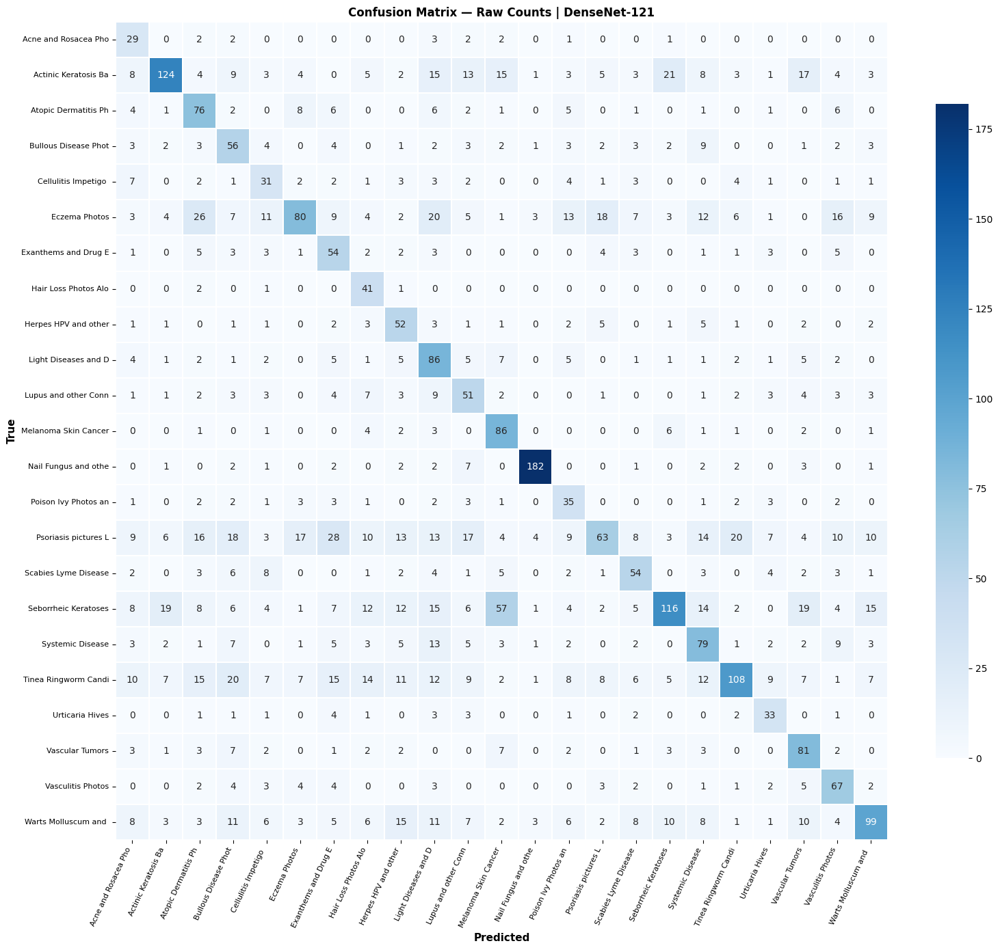

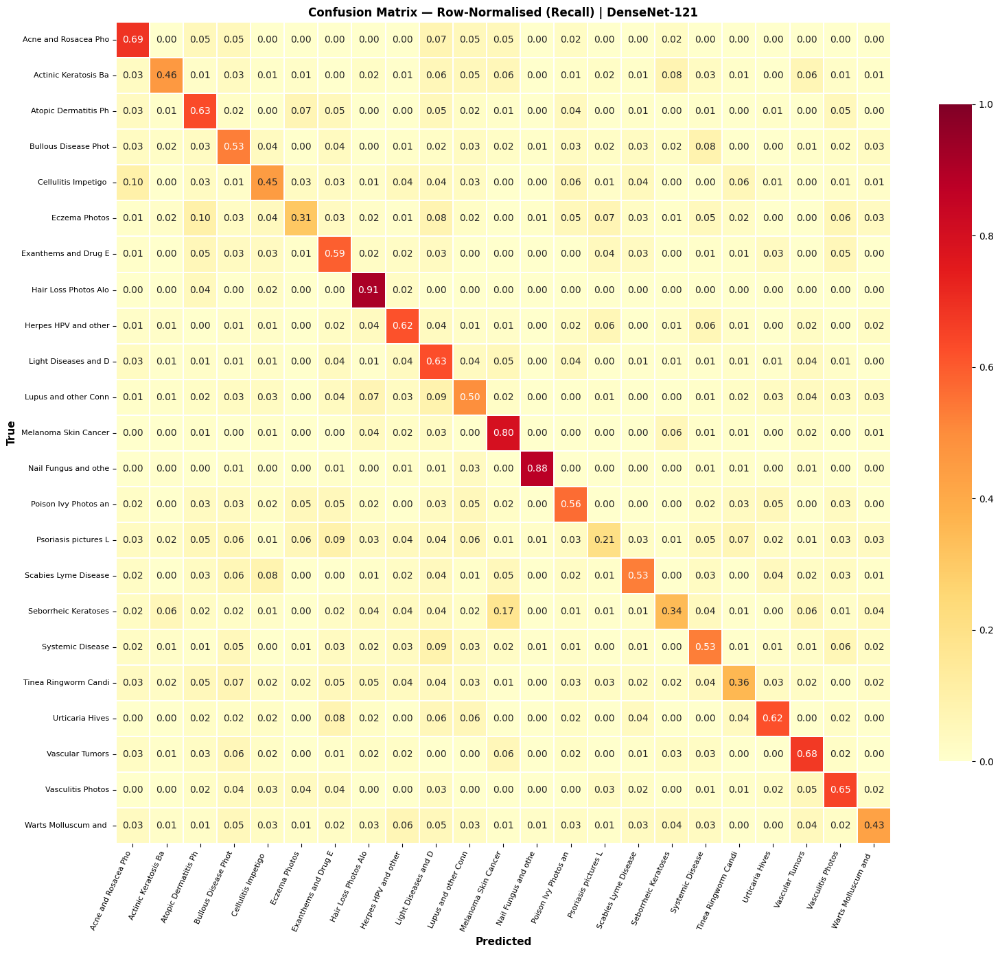

In [17]:
cm      = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
short   = [c[:20] for c in classes]

for title, data, fmt, cmap in [
    ('Raw Counts',              cm,      'd',   'Blues'),
    ('Row-Normalised (Recall)', cm_norm, '.2f', 'YlOrRd')
]:
    fig, ax = plt.subplots(figsize=(16, 14))
    sns.heatmap(data, annot=True, fmt=fmt, cmap=cmap,
                xticklabels=short, yticklabels=short,
                linewidths=0.3, ax=ax, cbar_kws={'shrink': 0.8},
                vmin=0, vmax=(1 if fmt == '.2f' else None))
    ax.set_xlabel('Predicted', fontsize=11, fontweight='bold')
    ax.set_ylabel('True',      fontsize=11, fontweight='bold')
    ax.set_title(f'Confusion Matrix — {title} | DenseNet-121', fontweight='bold')
    plt.xticks(rotation=65, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    fname = 'cm_raw.png' if fmt == 'd' else 'cm_normalised.png'
    plt.savefig(os.path.join(OUTPUT_DIR, fname), dpi=120, bbox_inches='tight')
    plt.show()

---
## Section 19 · Per-class Accuracy Analysis

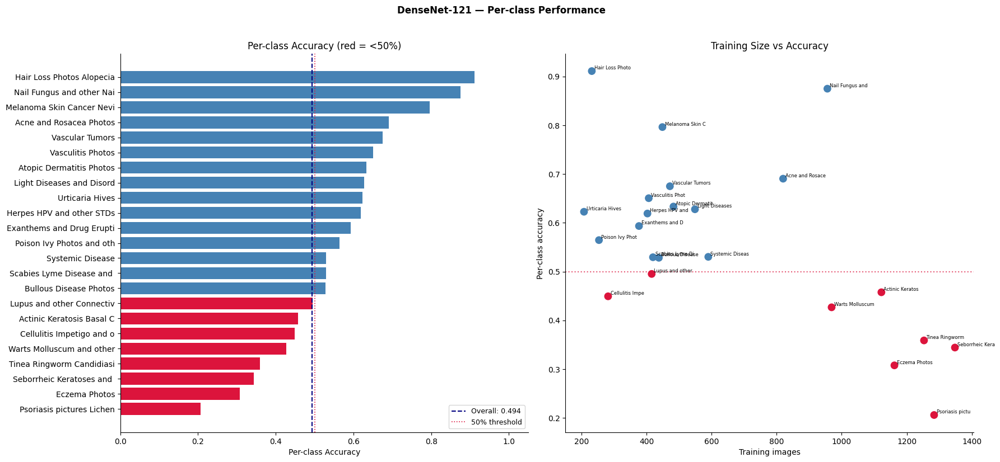

In [18]:
per_class_acc = cm_norm.diagonal()
train_counts  = train_df.groupby('label').size().reindex(range(NUM_CLASSES)).values
sorted_idx    = np.argsort(per_class_acc)

fig, axes = plt.subplots(1, 2, figsize=(18, max(6, NUM_CLASSES * 0.35)))

colors = ['crimson' if per_class_acc[i] < 0.5 else 'steelblue' for i in sorted_idx]
axes[0].barh([classes[i][:25] for i in sorted_idx], per_class_acc[sorted_idx], color=colors)
axes[0].axvline(overall_acc, color='navy',    ls='--', lw=1.5, label=f'Overall: {overall_acc:.3f}')
axes[0].axvline(0.5,         color='crimson', ls=':',  lw=1.2, label='50% threshold')
axes[0].set_xlabel('Per-class Accuracy'); axes[0].legend(fontsize=9)
axes[0].set_title('Per-class Accuracy (red = <50%)')
axes[0].set_xlim(0, 1.05)

axes[1].scatter(train_counts, per_class_acc,
               c=['crimson' if a < 0.5 else 'steelblue' for a in per_class_acc], s=80, zorder=3)
for i, cls in enumerate(classes):
    axes[1].annotate(cls[:15], (train_counts[i], per_class_acc[i]),
                     fontsize=6, xytext=(3, 2), textcoords='offset points')
axes[1].axhline(0.5, color='crimson', ls=':', alpha=0.7)
axes[1].set_xlabel('Training images'); axes[1].set_ylabel('Per-class accuracy')
axes[1].set_title('Training Size vs Accuracy')

plt.suptitle('DenseNet-121 — Per-class Performance', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'per_class_accuracy.png'), dpi=120, bbox_inches='tight')
plt.show()

---
## Section 20 · Best & Worst Performing Classes

In [19]:
metrics_df = pd.DataFrame({
    'Class':     classes,
    'Accuracy':  per_class_acc,
    'F1':        [report_dict[c]['f1-score']    for c in classes],
    'Precision': [report_dict[c]['precision']   for c in classes],
    'Recall':    [report_dict[c]['recall']       for c in classes],
    'Support':   [int(report_dict[c]['support']) for c in classes],
    'Train_N':   train_counts,
}).sort_values('F1', ascending=False)

print('TOP 5 BEST PERFORMING')
print(metrics_df.head(5).to_string(index=False, float_format='{:.4f}'.format))
print('\nBOTTOM 5 WORST PERFORMING')
print(metrics_df.tail(5).to_string(index=False, float_format='{:.4f}'.format))

metrics_df.to_csv(os.path.join(OUTPUT_DIR, 'per_class_metrics.csv'), index=False)

print('\nDIAGNOSIS GUIDE:')
print('  Low F1 + low Train_N  → data scarcity; consider oversampling')
print('  Low F1 + adequate N   → visual similarity; check confusion matrix')
print('  DenseNet note: dense connections preserve early colour features — check whether')
print('  colour-discriminative classes (high redness index, EDA VIZ 15) perform better')
print('  here than in EfficientNetV2-S or ConvNeXt-Base.')

TOP 5 BEST PERFORMING
                                                             Class  Accuracy     F1  Precision  Recall  Support  Train_N
                                Nail Fungus and other Nail Disease    0.8750 0.8988     0.9239  0.8750      208      956
                                                   Vascular Tumors    0.6750 0.5704     0.4939  0.6750      120      472
                               Melanoma Skin Cancer Nevi and Moles    0.7963 0.5621     0.4343  0.7963      108      449
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions    0.4576 0.5586     0.7168  0.4576      271     1122
                                                 Vasculitis Photos    0.6505 0.5469     0.4718  0.6505      103      407

BOTTOM 5 WORST PERFORMING
                                                Class  Accuracy     F1  Precision  Recall  Support  Train_N
                                        Eczema Photos    0.3077 0.4092     0.6107  0.3077      260     1162
         

---
## Section 21 · Confidence & Calibration Analysis

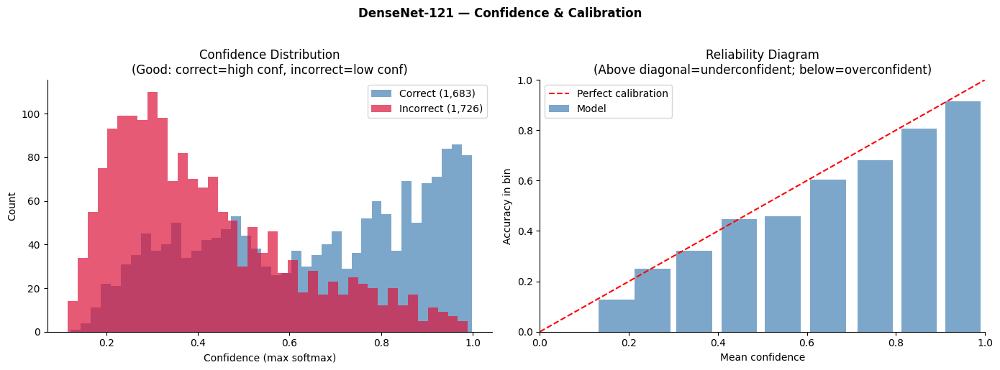

Mean confidence — correct: 0.6479 | incorrect: 0.4089


In [20]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(all_probs_max[correct_mask],  bins=40, alpha=0.7, color='steelblue',
             label=f'Correct ({correct_mask.sum():,})')
axes[0].hist(all_probs_max[~correct_mask], bins=40, alpha=0.7, color='crimson',
             label=f'Incorrect ({(~correct_mask).sum():,})')
axes[0].set_xlabel('Confidence (max softmax)'); axes[0].set_ylabel('Count')
axes[0].set_title('Confidence Distribution\n(Good: correct=high conf, incorrect=low conf)')
axes[0].legend()

bins = np.linspace(0, 1, 11)
bin_accs, bin_confs = [], []
for lo, hi in zip(bins[:-1], bins[1:]):
    mask = (all_probs_max >= lo) & (all_probs_max < hi)
    if mask.sum() > 0:
        bin_accs.append(correct_mask[mask].mean())
        bin_confs.append(all_probs_max[mask].mean())

axes[1].bar(bin_confs, bin_accs, width=0.08, alpha=0.7, color='steelblue', label='Model')
axes[1].plot([0, 1], [0, 1], 'r--', lw=1.5, label='Perfect calibration')
axes[1].set_xlabel('Mean confidence'); axes[1].set_ylabel('Accuracy in bin')
axes[1].set_title('Reliability Diagram\n(Above diagonal=underconfident; below=overconfident)')
axes[1].legend(); axes[1].set_xlim(0, 1); axes[1].set_ylim(0, 1)

plt.suptitle('DenseNet-121 — Confidence & Calibration', fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'confidence_calibration.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'Mean confidence — correct: {all_probs_max[correct_mask].mean():.4f} | '
      f'incorrect: {all_probs_max[~correct_mask].mean():.4f}')

---
## Section 22 · Top Confused Class Pairs

In [21]:
cm_off = cm.copy(); np.fill_diagonal(cm_off, 0)
flat   = np.argsort(cm_off.ravel())[::-1][:15]
ri, ci = np.unravel_index(flat, cm.shape)

confused_df = pd.DataFrame({
    'True Class':    [classes[r] for r in ri],
    'Predicted As':  [classes[c] for c in ci],
    'Count':         [cm_off[r, c] for r, c in zip(ri, ci)],
    'Recall Impact': [f'{cm_off[r,c]/cm[r,:].sum()*100:.1f}%' for r, c in zip(ri, ci)],
})
print('TOP 15 MOST CONFUSED PAIRS — DenseNet-121')
print('=' * 70)
print(confused_df.to_string(index=False))
print('\nDenseNet note: multi-scale feature reuse via dense connections should reduce confusion')
print('between classes that differ primarily in texture scale (e.g. fine papular vs coarse scaling).')
print('Cross-reference with EDA VIZ 20 (texture vs redness scatter).')
confused_df.to_csv(os.path.join(OUTPUT_DIR, 'confused_pairs.csv'), index=False)

TOP 15 MOST CONFUSED PAIRS — DenseNet-121
                                                        True Class                                                       Predicted As  Count Recall Impact
                      Seborrheic Keratoses and other Benign Tumors                                Melanoma Skin Cancer Nevi and Moles     57         16.9%
             Psoriasis pictures Lichen Planus and related diseases                                       Exanthems and Drug Eruptions     28          9.2%
                                                     Eczema Photos                                           Atopic Dermatitis Photos     26         10.0%
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions                       Seborrheic Keratoses and other Benign Tumors     21          7.7%
            Tinea Ringworm Candidiasis and other Fungal Infections                                             Bullous Disease Photos     20          6.6%
                            

---
## Section 23 · Grad-CAM Setup

### Why Grad-CAM for Skin Condition Diagnosis?
Grad-CAM is a clinical safety check. A model can achieve high accuracy while attending to the wrong regions — image borders, hair, rulers, colour calibration cards, or dermoscopy contact artefacts (EDA VIZ 13–14) rather than the lesion itself. For a medical AI system, attending to the wrong region is a fundamental failure mode regardless of test accuracy.

### Target Layer Selection for DenseNet-121
The correct Grad-CAM target for DenseNet-121 requires understanding the network structure:
- `model.features` contains the full feature extractor: stem → dense block 1 → transition 1 → … → dense block 4 → final BatchNorm
- `model.features.denseblock4` is the last dense block (16 bottleneck layers at 7×7 spatial resolution)
- The target layer is **`model.features.denseblock4.denselayer16.conv2`** — the final 3×3 convolution in the last bottleneck layer of Dense Block 4

**Why this specific layer?**
- Operates at 7×7 spatial resolution — sufficient for lesion localisation
- The 3×3 convolution is where spatial feature extraction happens in each bottleneck (the 1×1 before it is a channel reduction, not spatial processing)
- Being in the last dense block, its activations reflect the combined influence of all preceding layers through the dense concatenation paths
- The final BatchNorm (`model.features.norm5`) after this block collapses spatial statistics — targeting it would give poor Grad-CAM maps

**DenseNet Grad-CAM characteristic:** Because dense connections aggregate features from all preceding layers, Grad-CAM heatmaps for DenseNet tend to be more diffuse and multi-focal than EfficientNetV2-S (10×10 maps) or ConvNeXt-Base (7×7 depthwise maps). This reflects the model attending to multiple complementary feature regions simultaneously — not a failure mode, but a property of dense feature aggregation.

In [22]:
import cv2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# DenseNet-121 Grad-CAM target: last 3×3 conv in Dense Block 4, layer 16
target_layer = [model.features.denseblock4.denselayer16.conv2]

grad_cam = GradCAM(model=model, target_layers=target_layer)

def get_cam(img_path, class_idx):
    """Return (overlay, cam_map, rgb_img) for a given image and target class."""
    pil     = Image.open(img_path)
    t       = val_transform(pil).unsqueeze(0).to(DEVICE)
    cam     = grad_cam(input_tensor=t, targets=[ClassifierOutputTarget(class_idx)])[0]
    mean    = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std     = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    rgb     = torch.clamp(t.squeeze(0).cpu() * std + mean, 0, 1).permute(1, 2, 0).numpy()
    overlay = show_cam_on_image(rgb.astype(np.float32), cam, use_rgb=True)
    return overlay, cam, rgb

print(f'Grad-CAM target: {type(target_layer[0]).__name__}')
print(f'  → Dense Block 4, layer 16, conv2 (3×3 spatial conv, 7×7 feature maps)')
print(f'  → Reflects dense aggregation of all preceding feature maps')

Grad-CAM target: Conv2d
  → Dense Block 4, layer 16, conv2 (3×3 spatial conv, 7×7 feature maps)
  → Reflects dense aggregation of all preceding feature maps


---
## Section 24 · Correct Predictions Audit
*Verify the model attends to the lesion, not to background or acquisition artefacts.*

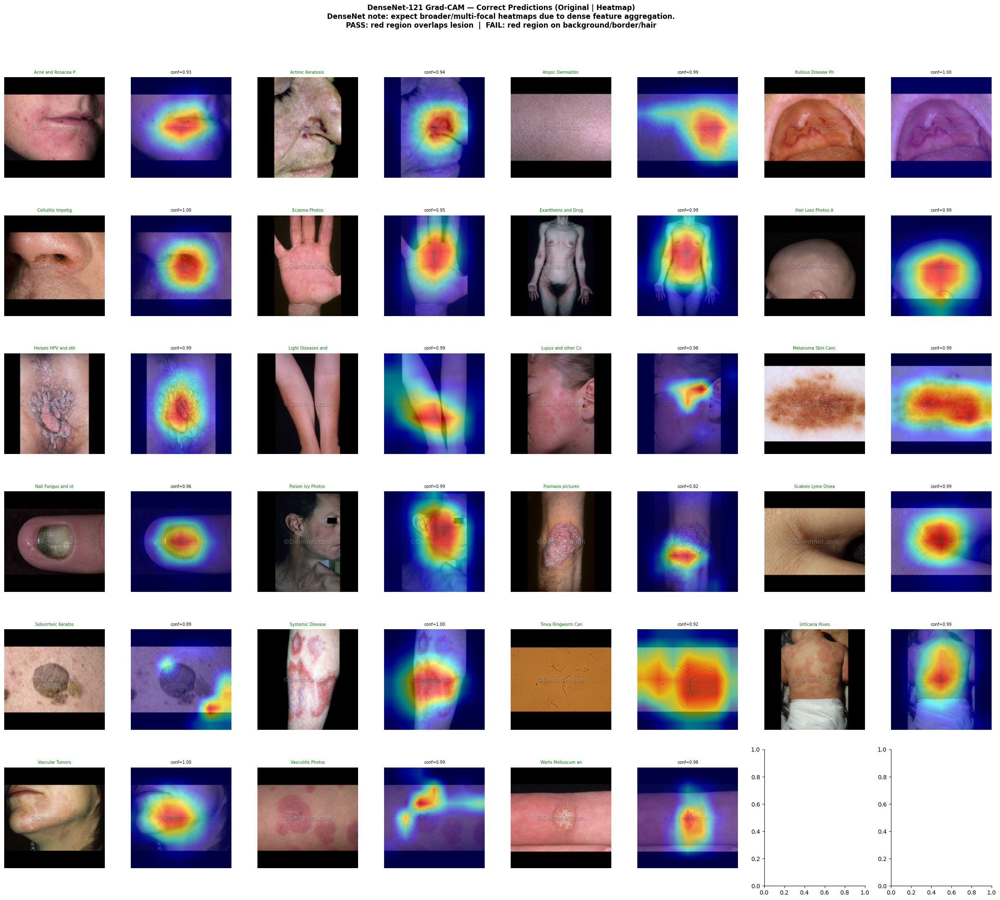

In [23]:
# Best correct prediction per class (highest confidence)
correct_samples = []
for cls_idx in range(NUM_CLASSES):
    mask = np.where(correct_mask & (all_labels == cls_idx))[0]
    if len(mask) == 0: continue
    correct_samples.append(mask[np.argsort(all_probs_max[mask])[::-1][0]])

n_cols = 4
n_rows = (len(correct_samples) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(n_cols * 6, n_rows * 3.5))

for i, idx in enumerate(correct_samples):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows > 1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows > 1 else axes[cp*2+1]
    overlay, _, rgb = get_cam(all_paths[idx], int(all_labels[idx]))
    ax0.imshow(rgb); ax0.set_title(classes[all_labels[idx]][:18], fontsize=7, color='green'); ax0.axis('off')
    ax1.imshow(overlay); ax1.set_title(f'conf={all_probs_max[idx]:.2f}', fontsize=7); ax1.axis('off')

plt.suptitle(
    'DenseNet-121 Grad-CAM — Correct Predictions (Original | Heatmap)\n'
    'DenseNet note: expect broader/multi-focal heatmaps due to dense feature aggregation.\n'
    'PASS: red region overlaps lesion  |  FAIL: red region on background/border/hair',
    fontweight='bold', y=1.02
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_correct.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 25 · High-Confidence Errors Audit
*Where does the model look when it fails confidently? Distinguishes visual similarity errors from shortcut learning.*

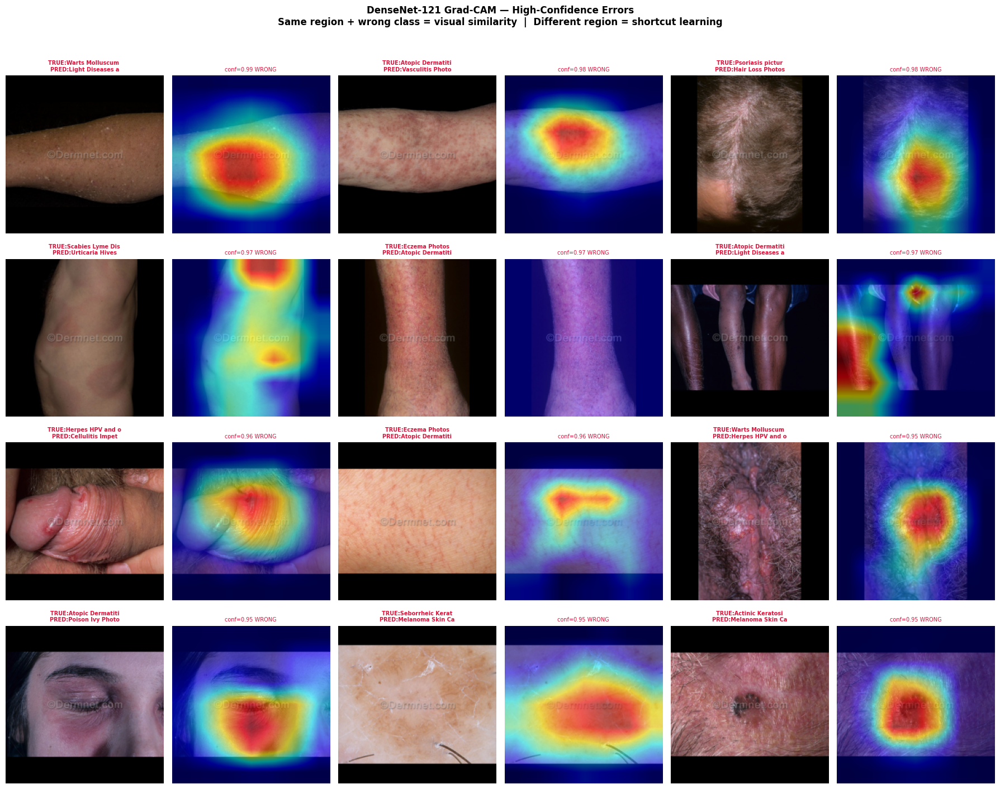

In [24]:
err_idx   = np.where(~correct_mask)[0]
hc_errors = err_idx[np.argsort(all_probs_max[err_idx])[::-1]][:12]

n_cols = 3; n_rows = (len(hc_errors) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(n_cols * 6, n_rows * 3.5))

for i, idx in enumerate(hc_errors):
    r, cp = divmod(i, n_cols)
    ax0 = axes[r, cp*2] if n_rows > 1 else axes[cp*2]
    ax1 = axes[r, cp*2+1] if n_rows > 1 else axes[cp*2+1]
    overlay, _, rgb = get_cam(all_paths[idx], int(all_preds[idx]))
    tc = classes[all_labels[idx]][:16]; pc = classes[all_preds[idx]][:16]
    ax0.imshow(rgb); ax0.set_title(f'TRUE:{tc}\nPRED:{pc}', fontsize=7, color='crimson', fontweight='bold'); ax0.axis('off')
    ax1.imshow(overlay); ax1.set_title(f'conf={all_probs_max[idx]:.2f} WRONG', fontsize=7, color='crimson'); ax1.axis('off')

plt.suptitle(
    'DenseNet-121 Grad-CAM — High-Confidence Errors\n'
    'Same region + wrong class = visual similarity  |  Different region = shortcut learning',
    fontweight='bold', y=1.02
)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_errors.png'), dpi=100, bbox_inches='tight')
plt.show()

---
## Section 26 · Per-class Grad-CAM Gallery
*One representative example per condition: Original | True-class CAM | Predicted-class CAM.*

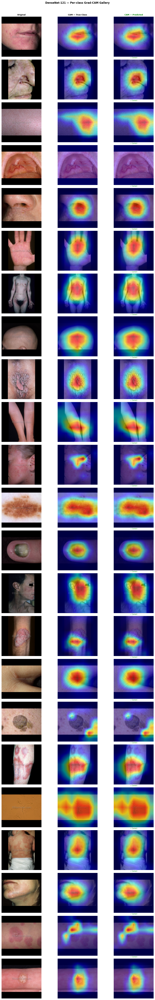

In [25]:
fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, NUM_CLASSES * 2.8))

for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels == ci))[0]
    if len(pool) == 0: pool = np.where(all_labels == ci)[0]
    if len(pool) == 0:
        for col in range(3): axes[ci, col].axis('off')
        continue
    idx            = pool[np.argsort(all_probs_max[pool])[::-1][0]]
    _, _, rgb      = get_cam(all_paths[idx], ci)
    ov_true, _, _  = get_cam(all_paths[idx], ci)
    pred_ci        = int(all_preds[idx])
    ov_pred, _, _  = get_cam(all_paths[idx], pred_ci)
    pred_lbl = '✓ Correct' if pred_ci == ci else classes[pred_ci][:16]
    pred_col = 'green' if pred_ci == ci else 'crimson'

    axes[ci, 0].imshow(rgb)
    axes[ci, 0].set_ylabel(classes[ci][:22], rotation=0, labelpad=105, va='center', fontsize=7, fontweight='bold')
    axes[ci, 0].axis('off')
    if ci == 0: axes[ci, 0].set_title('Original', fontsize=9, fontweight='bold')

    axes[ci, 1].imshow(ov_true); axes[ci, 1].axis('off')
    if ci == 0: axes[ci, 1].set_title('CAM — True Class', fontsize=9, fontweight='bold')

    axes[ci, 2].imshow(ov_pred)
    axes[ci, 2].set_title(pred_lbl, fontsize=7, color=pred_col)
    axes[ci, 2].axis('off')
    if ci == 0: axes[ci, 2].set_title('CAM — Predicted', fontsize=9, fontweight='bold')

plt.suptitle('DenseNet-121 — Per-class Grad-CAM Gallery', fontweight='bold', y=1.005)
plt.tight_layout(h_pad=0.2)
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_gallery.png'), dpi=90, bbox_inches='tight')
plt.show()

---
## Section 27 · Centre Coverage Score
*Quantifies what fraction of Grad-CAM activation falls on the lesion centre vs the image periphery. For DenseNet, expect broader activation regions — the coverage metric captures whether these broader activations still focus on the clinically relevant centre.*

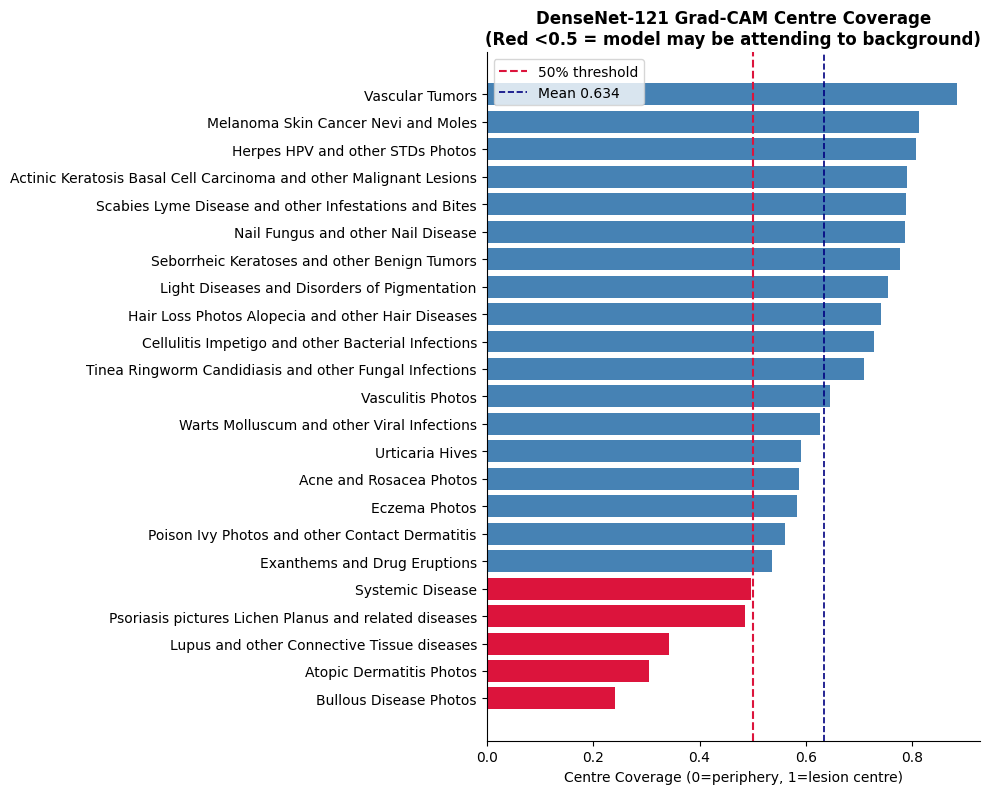

Mean coverage: 0.6336
Classes needing manual review: ['Bullous Disease Photos', 'Atopic Dermatitis Photos', 'Lupus and other Connective Tissue diseases', 'Psoriasis pictures Lichen Planus and related diseases', 'Systemic Disease']


In [26]:
def centre_coverage(cam_map, frac=0.6):
    h, w = cam_map.shape
    mh, mw = int(h * (1 - frac) / 2), int(w * (1 - frac) / 2)
    return cam_map[mh:h-mh, mw:w-mw].sum() / (cam_map.sum() + 1e-8)

cov_rows = []
for ci in range(NUM_CLASSES):
    pool = np.where(correct_mask & (all_labels == ci))[0][:5]
    for idx in pool:
        _, cam_map, _ = get_cam(all_paths[idx], ci)
        cov_rows.append({'Class': classes[ci], 'Coverage': centre_coverage(cam_map)})

cov_df    = pd.DataFrame(cov_rows)
class_cov = cov_df.groupby('Class')['Coverage'].mean().sort_values()

fig, ax = plt.subplots(figsize=(10, max(5, NUM_CLASSES * 0.35)))
colors  = ['crimson' if v < 0.5 else 'steelblue' for v in class_cov.values]
ax.barh(class_cov.index, class_cov.values, color=colors)
ax.axvline(0.5,              color='crimson', ls='--', lw=1.5, label='50% threshold')
ax.axvline(class_cov.mean(), color='navy',   ls='--', lw=1.2,
           label=f'Mean {class_cov.mean():.3f}')
ax.set_xlabel('Centre Coverage (0=periphery, 1=lesion centre)')
ax.set_title('DenseNet-121 Grad-CAM Centre Coverage\n'
             '(Red <0.5 = model may be attending to background)', fontweight='bold')
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'gradcam_coverage.png'), dpi=120, bbox_inches='tight')
plt.show()

low_cov = class_cov[class_cov < 0.5]
print(f'Mean coverage: {class_cov.mean():.4f}')
if len(low_cov):
    print(f'Classes needing manual review: {list(low_cov.index)}')
else:
    print('All classes: adequate centre coverage (>0.5).')

---
## Section 28 · Final Summary

In [27]:
macro_f1 = report_dict['macro avg']['f1-score']
macro_r  = report_dict['macro avg']['recall']
macro_p  = report_dict['macro avg']['precision']
wt_f1    = report_dict['weighted avg']['f1-score']
top3     = top_k_accuracy_score(all_labels, all_probs, k=3, labels=list(range(NUM_CLASSES)))
top5     = top_k_accuracy_score(all_labels, all_probs, k=5, labels=list(range(NUM_CLASSES)))

print('=' * 60)
print('  FINAL RESULTS — DenseNet-121 on DermNet')
print('=' * 60)
print(f'  Top-1 Accuracy     : {overall_acc:.4f}  ({overall_acc*100:.2f}%)')
print(f'  Top-3 Accuracy     : {top3:.4f}  ({top3*100:.2f}%)')
print(f'  Top-5 Accuracy     : {top5:.4f}  ({top5*100:.2f}%)')
print(f'  Macro Precision    : {macro_p:.4f}')
print(f'  Macro Recall       : {macro_r:.4f}')
print(f'  Macro F1 (primary) : {macro_f1:.4f}')
print(f'  Weighted F1        : {wt_f1:.4f}')
print(f'  Best class F1      : {metrics_df["F1"].max():.4f}  ({metrics_df.iloc[0]["Class"]})')
print(f'  Worst class F1     : {metrics_df["F1"].min():.4f}  ({metrics_df.iloc[-1]["Class"]})')
print(f'  CAM coverage (mean): {class_cov.mean():.4f}')
print(f'  CAM low-coverage   : {len(low_cov)} class(es) flagged')
print('=' * 60)
print('\n  Architecture notes:')
print('  - Dense connections (L(L+1)/2 paths) → colour + texture features preserved at all depths')
print('  - ~8M params (lightest of the four models) → fastest training, lowest VRAM footprint')
print('  - BatchNorm throughout → performance may degrade slightly vs LayerNorm (ConvNeXt)')
print('    under high acquisition variability (EDA VIZ 13-14)')
print('  - Grad-CAM at Dense Block 4 conv2 → expect broader heatmaps than other models')
print('  - Dense gradient flow → robust training on minority classes (EDA VIZ 1-5)')
print(f'\n  Outputs saved to: {OUTPUT_DIR}')
print('  classification_report.txt  |  per_class_metrics.csv  |  confused_pairs.csv')
print('  training_curves_fold0.png  |  cm_raw.png  |  cm_normalised.png')
print('  per_class_accuracy.png     |  confidence_calibration.png')
print('  gradcam_correct.png        |  gradcam_errors.png')
print('  gradcam_gallery.png        |  gradcam_coverage.png')

  FINAL RESULTS — DenseNet-121 on DermNet
  Top-1 Accuracy     : 0.4937  (49.37%)
  Top-3 Accuracy     : 0.7260  (72.60%)
  Top-5 Accuracy     : 0.8205  (82.05%)
  Macro Precision    : 0.4809
  Macro Recall       : 0.5605
  Macro F1 (primary) : 0.4868
  Weighted F1        : 0.4892
  Best class F1      : 0.8988  (Nail Fungus and other Nail Disease)
  Worst class F1     : 0.2993  (Psoriasis pictures Lichen Planus and related diseases)
  CAM coverage (mean): 0.6336
  CAM low-coverage   : 5 class(es) flagged

  Architecture notes:
  - Dense connections (L(L+1)/2 paths) → colour + texture features preserved at all depths
  - ~8M params (lightest of the four models) → fastest training, lowest VRAM footprint
  - BatchNorm throughout → performance may degrade slightly vs LayerNorm (ConvNeXt)
    under high acquisition variability (EDA VIZ 13-14)
  - Grad-CAM at Dense Block 4 conv2 → expect broader heatmaps than other models
  - Dense gradient flow → robust training on minority classes (EDA VIZ